<a href="https://colab.research.google.com/github/ritwiks9635/Sequence_Model_Project/blob/main/Visual_Question_Answering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**BLIP Medical Visual Question Answering**


#**Introduction**

A successfully trained and inferred medical Visual Question Answering (VQA) model represents a significant advancement in the field of healthcare and medical image analysis. Such a model combines computer vision and natural language processing to provide valuable insights and answers to medical professionals, researchers, and patients.

Here are some key conclusions and takeaways from the development and deployment of a successful medical VQA model:

**Improved Clinical Decision Support:** A well-trained medical VQA model enhances clinical decision-making by allowing healthcare providers to ask questions about medical images (e.g., X-rays, MRIs, CT scans) and receive accurate, rapid answers. This can lead to faster diagnoses and treatment plans.

**Reducing Interpretation Errors:** Human interpretation of medical images can be subjective and prone to errors. A VQA model can provide objective, consistent, and evidence-based interpretations, helping to reduce diagnostic inaccuracies.

**Time Efficiency:** The model's ability to quickly analyze images and answer questions can save valuable time for healthcare professionals, leading to more efficient patient care.

**Accessibility:** Patients and non-specialist healthcare providers can benefit from a medical VQA system by obtaining easy-to-understand information about their health conditions, potentially improving health literacy.
Learning and Training Aid: Medical VQA models can serve as educational tools for medical students, residents, and even experienced practitioners. They can be used to explain complex medical concepts and imaging findings.

**Research Assistance:** Researchers can leverage the model to analyze large datasets of medical images more effectively. It can assist in extracting meaningful insights from these datasets, potentially leading to new discoveries in medical science.

**Cross-Specialty Applicability:** A well-designed medical VQA model can be adapted to various medical specialties, from radiology and pathology to cardiology and dermatology. This versatility makes it a valuable asset across different healthcare domains.

**Ethical Considerations:** It's essential to address ethical concerns related to privacy, security, and bias when deploying medical VQA models in healthcare settings. Ensuring patient data protection and model fairness is critical.

**Continuous Improvement:** Model performance and accuracy should be continuously monitored and improved over time. Regular updates and retraining are necessary to keep up with evolving medical knowledge and technologies.

**Collaboration:** Successful implementation of medical VQA models often requires collaboration between machine learning experts, healthcare professionals, and ethicists to ensure that the technology is used responsibly and effectively.

#**BLIP**
**Overview**

The BLIP model was proposed in BLIP: Bootstrapping Language-Image Pre-training for Unified Vision-Language Understanding and Generation by Junnan Li, Dongxu Li, Caiming Xiong, Steven Hoi.
BLIP is a model that is able to perform various multi-modal tasks including
Visual Question AnsweringImage-Text retrieval (Image-text matching)Image Captioning
The abstract from the paper is the following:
Vision-Language Pre-training (VLP) has advanced the performance for many vision-language tasks. However, most existing pre-trained models only excel in either understanding-based tasks or generation-based tasks. Furthermore, performance improvement has been largely achieved by scaling up the dataset with noisy image-text pairs collected from the web, which is a suboptimal source of supervision. In this paper, we propose BLIP, a new VLP framework which transfers flexibly to both vision-language understanding and generation tasks. BLIP effectively utilizes the noisy web data by bootstrapping the captions, where a captioner generates synthetic captions and a filter removes the noisy ones. We achieve state-of-the-art results on a wide range of vision-language tasks, such as image-text retrieval (+2.7% in average recall@1), image captioning (+2.8% in CIDEr), and VQA (+1.6% in VQA score). BLIP also demonstrates strong generalization ability when directly transferred to videolanguage tasks in a zero-shot manner. Code, models, and datasets are released.


#**Visual Question Answering**

**What is visual Question Answering?**

Visual Question Answering (VQA) is a task in computer vision that involves answering questions about an image. The goal of VQA is to teach machines to understand the content of an image and answer questions about it in natural language.

![](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTelYPPGJe7V1MTsPP0bWQ780bYOnj2lS3xy7AFvxtKxriu6oDeZr6D882X&s=10)

In [1]:
!pip install transformers[torch] datasets -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.1/290.1 kB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 63.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 68.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 92.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 987.1 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 14.5 MB/s eta 0:00:00
     ━━━━━━━

In [2]:
import requests
from PIL import Image
import torch
from transformers import BlipProcessor, BlipForQuestionAnswering,BlipImageProcessor, AutoProcessor
from transformers import BlipConfig
from datasets import load_dataset
from torch.utils.data import DataLoader, Dataset
from tqdm.notebook import tqdm

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


#**About the Dataset**
PathVQA is a dataset of question-answer pairs on pathology images. The dataset is intended to be used for training and testing Medical Visual Question Answering (VQA) systems. The dataset includes both open-ended questions and binary "yes/no" questions. The dataset is built from two publicly-available pathology textbooks: "Textbook of Pathology" and "Basic Pathology", and a publicly-available digital library: "Pathology Education Informational Resource" (PEIR). The copyrights of images and captions belong to the publishers and authors of these two books, and the owners of the PEIR digital library.

In [4]:
dataset = load_dataset("flaviagiammarino/path-vqa")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/19654 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/6259 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/6719 [00:00<?, ? examples/s]

In [5]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 19654
    })
    validation: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 6259
    })
    test: Dataset({
        features: ['image', 'question', 'answer'],
        num_rows: 6719
    })
})

Question :: does this image show three cut sections many lesions several days of age?
Answer :: yes


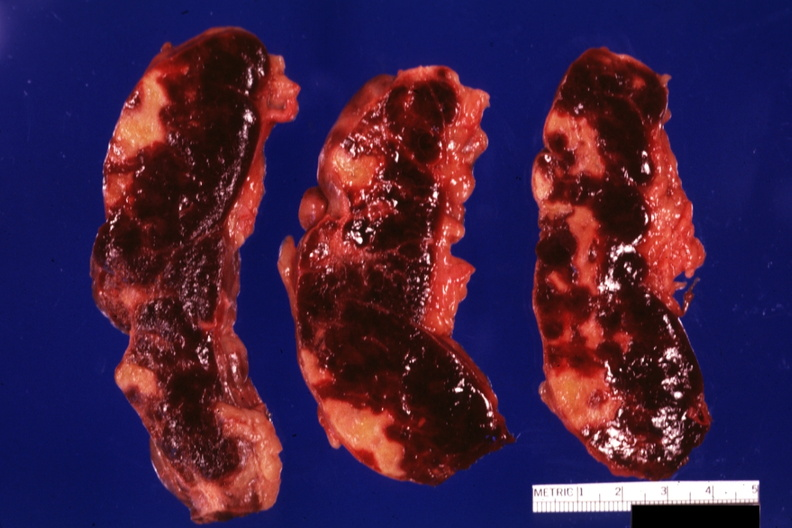

In [6]:
sample = dataset["train"][1019]
sample_img = Image.fromarray(np.array(sample["image"])).convert("RGB")
print("Question ::", sample["question"])
print("Answer ::", sample["answer"])
sample_img

In [7]:
config = BlipConfig.from_pretrained("Salesforce/blip-vqa-base")

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

In [8]:
config

BlipConfig {
  "architectures": [
    "BlipForQuestionAnswering"
  ],
  "image_text_hidden_size": 256,
  "initializer_factor": 1.0,
  "initializer_range": 0.02,
  "label_smoothing": 0.0,
  "logit_scale_init_value": 2.6592,
  "model_type": "blip",
  "projection_dim": 512,
  "text_config": {
    "initializer_factor": 1.0,
    "model_type": "blip_text_model",
    "num_attention_heads": 12
  },
  "torch_dtype": "float32",
  "transformers_version": "4.38.2",
  "vision_config": {
    "dropout": 0.0,
    "initializer_factor": 1.0,
    "initializer_range": 0.02,
    "model_type": "blip_vision_model",
    "num_channels": 3
  }
}

In [9]:
trainset = dataset["train"].select(range(10000))
validset = dataset["validation"].select(range(1000))

#**Build Data-loader**

In [10]:
class VQADataset(Dataset):
    def __init__(self, data, segment, text_processor, image_processor):
        self.data = data
        self.questions = data["question"]
        self.answers = data["answer"]
        self.text_processor = text_processor
        self.image_processor = image_processor
        self.max_length = 32
        self.image_height = 128
        self.image_width = 128

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        answers = self.answers[idx]
        questions = self.questions[idx]
        image = self.data[idx]["image"].convert("RGB")
        text = self.questions[idx]
        image_encoding = self.image_processor(image,
            do_resize = True, size = (self.image_height, self.image_width),
            return_tensors = "pt")

        text_encoding = self.text_processor(None, text, padding = "max_length",
            truncation = True, max_length = self.max_length, return_tensors = "pt")

        for k, v in text_encoding.items():
            text_encoding[k] = v.squeeze()
        text_encoding["pixel_values"] = image_encoding["pixel_values"][0]

        labels = self.text_processor.tokenizer.encode(
            answers,
            max_length = self.max_length,
            padding = "max_length",
            truncation = True,
            return_tensors = "pt")[0]
        text_encoding["labels"] = labels

        return text_encoding

In [11]:
text_processor = BlipProcessor.from_pretrained("Salesforce/blip-vqa-base")
image_processor = BlipImageProcessor.from_pretrained("Salesforce/blip-vqa-base")

preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

In [12]:
text_processor

BlipProcessor:
- image_processor: BlipImageProcessor {
  "do_convert_rgb": true,
  "do_normalize": true,
  "do_pad": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.48145466,
    0.4578275,
    0.40821073
  ],
  "image_processor_type": "BlipImageProcessor",
  "image_std": [
    0.26862954,
    0.26130258,
    0.27577711
  ],
  "processor_class": "BlipProcessor",
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 384,
    "width": 384
  },
  "size_divisor": 32
}

- tokenizer: BertTokenizerFast(name_or_path='Salesforce/blip-vqa-base', vocab_size=30522, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'unk_token': '[UNK]', 'sep_token': '[SEP]', 'pad_token': '[PAD]', 'cls_token': '[CLS]', 'mask_token': '[MASK]'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("[PAD]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	100: Add

In [13]:
train_vqa_dataset = VQADataset(data = trainset,
                     segment='train',
                     text_processor = text_processor,
                     image_processor = image_processor)

val_vqa_dataset = VQADataset(data = trainset,
                     segment='validation',
                     text_processor = text_processor,
                     image_processor = image_processor)

In [14]:
train_vqa_dataset[0]

{'input_ids': tensor([  101,  2073,  2024, 11290,  7872,  4442,  1006,  9242,  4442,  1007,
         2284,  1029,   102,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0]), 'attention_mask': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0]), 'pixel_values': tensor([[[0.6895, 0.8647, 0.9814,  ..., 0.9668, 1.2150, 1.4194],
         [1.0252, 0.9814, 1.0106,  ..., 1.0398, 1.3902, 1.2880],
         [0.9960, 1.0836, 0.8501,  ..., 1.0398, 1.2442, 1.1420],
         ...,
         [0.9668, 0.5581, 0.0617,  ..., 1.0106, 0.9376, 0.8792],
         [0.7917, 0.9960, 0.8647,  ..., 1.1420, 1.0252, 0.9230],
         [0.5581, 0.9522, 0.9376,  ..., 1.1420, 0.9376, 0.9668]],

        [[1.1594, 1.3995, 1.5196,  ..., 1.3695, 1.6247, 1.8948],
         [1.5946, 1.4746, 1.5046,  ..., 1.4446, 1.8047, 1.6847],
         [1.5196, 1.5946, 1.5196,  ..., 1.47

In [15]:
def collate_fn(batch):
    input_ids = [item['input_ids'] for item in batch]
    pixel_values = [item['pixel_values'] for item in batch]
    attention_mask = [item['attention_mask'] for item in batch]
    labels = [item['labels'] for item in batch]
    # create new batch
    batch = {}
    batch['input_ids'] = torch.stack(input_ids)
    batch['attention_mask'] = torch.stack(attention_mask)
    batch['pixel_values'] = torch.stack(pixel_values)
    batch['labels'] = torch.stack(labels)

    return batch

In [16]:
trainloader = DataLoader(train_vqa_dataset, collate_fn = collate_fn, batch_size = 16, shuffle = False)
validloader = DataLoader(val_vqa_dataset, collate_fn = collate_fn, batch_size = 16, shuffle = False)

In [17]:
batch = next(iter(trainloader))
for k,v in batch.items():
    print(k, v.shape)

input_ids torch.Size([16, 32])
attention_mask torch.Size([16, 32])
pixel_values torch.Size([16, 3, 128, 128])
labels torch.Size([16, 32])


#**Build Model**

In [18]:
model = BlipForQuestionAnswering.from_pretrained("Salesforce/blip-vqa-base" )
model.to(device)

model.safetensors:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

BlipForQuestionAnswering(
  (vision_model): BlipVisionModel(
    (embeddings): BlipVisionEmbeddings(
      (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (encoder): BlipEncoder(
      (layers): ModuleList(
        (0-11): 12 x BlipEncoderLayer(
          (self_attn): BlipAttention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (projection): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): BlipMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((768,), eps=1e-05, e

In [19]:
optimizer = torch.optim.AdamW(model.parameters(), lr = 5e-5)
image_mean = image_processor.image_mean
image_std = image_processor.image_std

Question:  [CLS] is normal palmar creases present? [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
Answer:  [CLS] no [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]


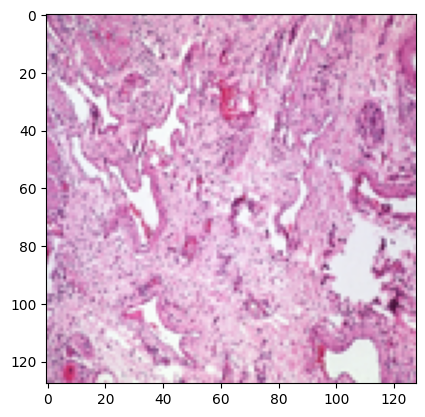

In [20]:
batch_idx = 5

unnormalized_image = (batch["pixel_values"][batch_idx].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)

print("Question: ",text_processor.decode(batch["input_ids"][batch_idx]))
print("Answer: ",text_processor.decode(batch["labels"][batch_idx]))
plt.imshow(Image.fromarray(unnormalized_image))

#**Training**
if train >= 100 epochs so get better results

In [21]:
model.train()
for epoch in range(10):
    print(f"Epoch: {epoch}")
    total_loss = []
    for batch in tqdm(trainloader):
        # get the inputs;
        batch = {k:v.to(device) for k,v in batch.items()}

        # zero the parameter gradients
        optimizer.zero_grad()
        # forward + backward + optimize
        outputs = model(**batch)
        loss = outputs.loss
        total_loss.append(loss.item())
        loss.backward()
        optimizer.step()
    print("Loss:", sum(total_loss))

Epoch: 0


  0%|          | 0/625 [00:00<?, ?it/s]

We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.


Loss: 600.2982842121273
Epoch: 1


  0%|          | 0/625 [00:00<?, ?it/s]

Loss: 157.8743043448776
Epoch: 2


  0%|          | 0/625 [00:00<?, ?it/s]

Loss: 115.9194664338138
Epoch: 3


  0%|          | 0/625 [00:00<?, ?it/s]

Loss: 87.8181088991696
Epoch: 4


  0%|          | 0/625 [00:00<?, ?it/s]

Loss: 70.21839458937757
Epoch: 5


  0%|          | 0/625 [00:00<?, ?it/s]

Loss: 58.27188941184431
Epoch: 6


  0%|          | 0/625 [00:00<?, ?it/s]

Loss: 62.08695701340912
Epoch: 7


  0%|          | 0/625 [00:00<?, ?it/s]

Loss: 83.56230112165213
Epoch: 8


  0%|          | 0/625 [00:00<?, ?it/s]

Loss: 82.0395444817841
Epoch: 9


  0%|          | 0/625 [00:00<?, ?it/s]

Loss: 83.25409977510571


Question:  where are liver stem cells ( oval cells ) located?


/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1178: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Predicted Answer:  no
Actual Answer:  in the canals of hering


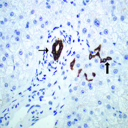

###################################################################
Question:  what are stained here with an immunohistochemical stain for cytokeratin 7?
Predicted Answer:  no
Actual Answer:  bile duct cells and canals of hering


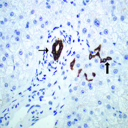

###################################################################
Question:  what do the areas of white chalky deposits represent?
Predicted Answer:  no
Actual Answer:  foci of fat necrosis


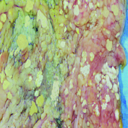

###################################################################
Question:  is embolus derived from a lower - extremity deep venous thrombus lodged in a pulmonary artery branch?
Predicted Answer:  no
Actual Answer:  yes


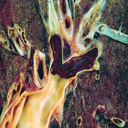

###################################################################
Question:  how is hyperplasia without atypia characterized?
Predicted Answer:  no
Actual Answer:  by nests of closely packed glands


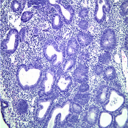

###################################################################
Question:  is normal palmar creases present?
Predicted Answer:  no
Actual Answer:  no


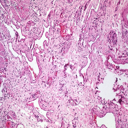

###################################################################
Question:  where is this from?
Predicted Answer:  no
Actual Answer:  gastrointestinal system


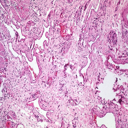

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


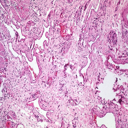

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  esophagus


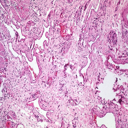

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  varices


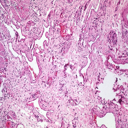

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  excellent photo typical adenocarcinoma extending through muscularis to serosa


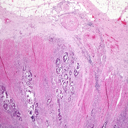

###################################################################
Question:  does this image show excellent photo typical adenocarcinoma extending through muscularis to serosa?
Predicted Answer:  no
Actual Answer:  yes


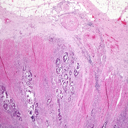

###################################################################
Question:  does typical tuberculous exudate show excellent photo typical adenocarcinoma extending through muscularis to serosa?
Predicted Answer:  no
Actual Answer:  no


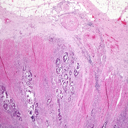

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


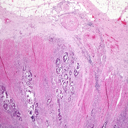

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


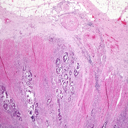

###################################################################
Question:  is hyperplasia without atypia characterized by nests of closely packed glands?
Predicted Answer:  no
Actual Answer:  yes


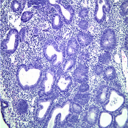

###################################################################
Question:  is mucoepidermoid carcinoma present?
Predicted Answer:  no
Actual Answer:  no


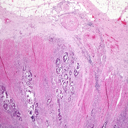

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


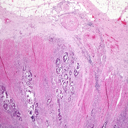

###################################################################
Question:  is colon present?
Predicted Answer:  no
Actual Answer:  yes


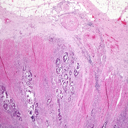

###################################################################
Question:  is edema present?
Predicted Answer:  no
Actual Answer:  no


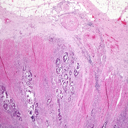

###################################################################
Question:  where is this from?
Predicted Answer:  no
Actual Answer:  gastrointestinal system


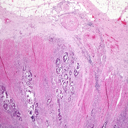

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


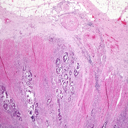

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


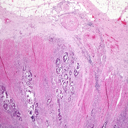

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  typical infiltrating adenocarcinoma


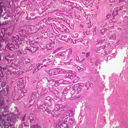

###################################################################
Question:  does this image show typical infiltrating adenocarcinoma?
Predicted Answer:  no
Actual Answer:  yes


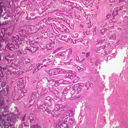

###################################################################
Question:  does retroperitoneal leiomyosarcoma show typical infiltrating adenocarcinoma?
Predicted Answer:  no
Actual Answer:  no


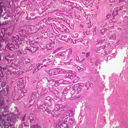

###################################################################
Question:  is endoscopic view of a longitudinally - oriented mallory - weiss characterized by nests of closely packed glands?
Predicted Answer:  no
Actual Answer:  no


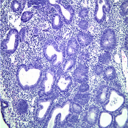

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


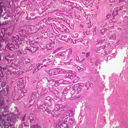

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


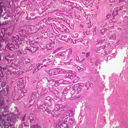

###################################################################
Question:  is adrenal present?
Predicted Answer:  no
Actual Answer:  no


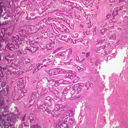

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


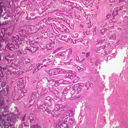

###################################################################
Question:  is colon present?
Predicted Answer:  no
Actual Answer:  yes


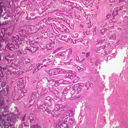

###################################################################
Question:  is coronary artery anomalous origin left from pulmonary artery present?
Predicted Answer:  no
Actual Answer:  no


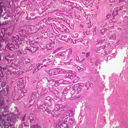

###################################################################
Question:  where is this from?
Predicted Answer:  no
Actual Answer:  gastrointestinal system


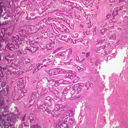

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


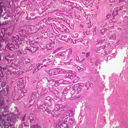

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


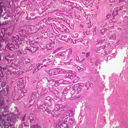

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  typical histology for colon adenocarcinoma


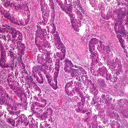

###################################################################
Question:  what is seen as glandular crowding and cellular atypia?
Predicted Answer:  no
Actual Answer:  hyperplasia without atypia


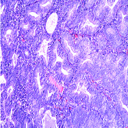

###################################################################
Question:  does this image show typical histology for colon adenocarcinoma?
Predicted Answer:  no
Actual Answer:  yes


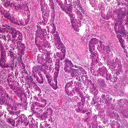

###################################################################
Question:  does amyloid angiopathy r. endocrine show typical histology for colon adenocarcinoma?
Predicted Answer:  no
Actual Answer:  no


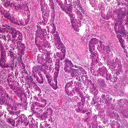

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


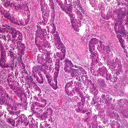

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


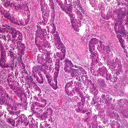

###################################################################
Question:  is alpha smooth muscle actin immunohistochemical present?
Predicted Answer:  no
Actual Answer:  no


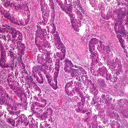

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


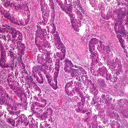

###################################################################
Question:  is colon present?
Predicted Answer:  no
Actual Answer:  yes


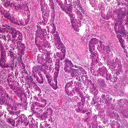

###################################################################
Question:  is lymphangiomatosis present?
Predicted Answer:  no
Actual Answer:  no


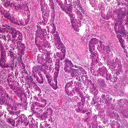

###################################################################
Question:  where is this from?
Predicted Answer:  no
Actual Answer:  gastrointestinal system


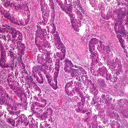

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


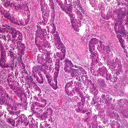

###################################################################
Question:  what is hyperplasia with atypia seen as?
Predicted Answer:  no
Actual Answer:  glandular crowding and cellular atypia


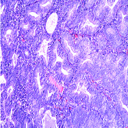

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


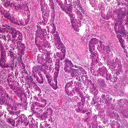

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  typical excellent pinworm


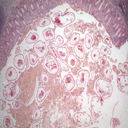

###################################################################
Question:  does this image show typical excellent pinworm?
Predicted Answer:  no
Actual Answer:  yes


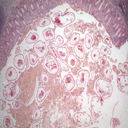

###################################################################
Question:  does acid show typical excellent pinworm?
Predicted Answer:  no
Actual Answer:  no


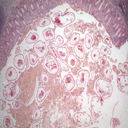

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


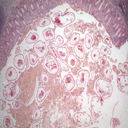

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


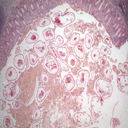

###################################################################
Question:  is myocardium present?
Predicted Answer:  no
Actual Answer:  no


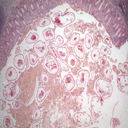

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  appendix


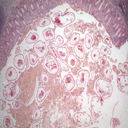

###################################################################
Question:  is appendix present?
Predicted Answer:  no
Actual Answer:  yes


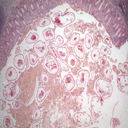

###################################################################
Question:  is carcinoma metastatic lung present?
Predicted Answer:  no
Actual Answer:  no


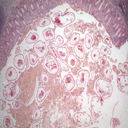

###################################################################
Question:  is hyperplasia with atypia seen as glandular crowding and cellular atypia?
Predicted Answer:  no
Actual Answer:  yes


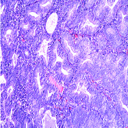

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  pinworm


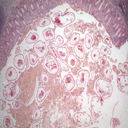

###################################################################
Question:  is pinworm present?
Predicted Answer:  no
Actual Answer:  yes


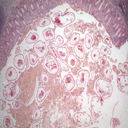

###################################################################
Question:  is normal ovary present?
Predicted Answer:  no
Actual Answer:  no


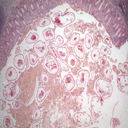

###################################################################
Question:  where is this from?
Predicted Answer:  no
Actual Answer:  gastrointestinal system


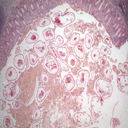

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


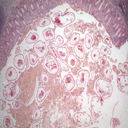

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  appendix


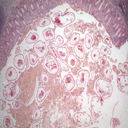

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  pinworm


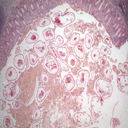

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  trophozoite source


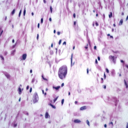

###################################################################
Question:  does this image show trophozoite source?
Predicted Answer:  no
Actual Answer:  yes


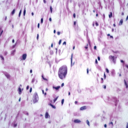

###################################################################
Question:  does glomerulosa show trophozoite source?
Predicted Answer:  no
Actual Answer:  no


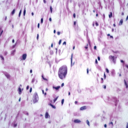

###################################################################
Question:  is a binucleate reed - sternberg cell with large, inclusion - like nucleoli and abundant cytoplasm seen as glandular
Predicted Answer:  no
Actual Answer:  no


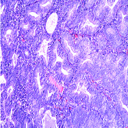

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


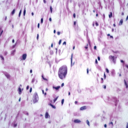

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


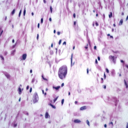

###################################################################
Question:  is metastatic carcinoma prostate present?
Predicted Answer:  no
Actual Answer:  no


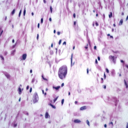

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


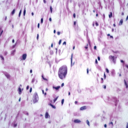

###################################################################
Question:  is colon present?
Predicted Answer:  no
Actual Answer:  yes


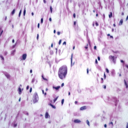

###################################################################
Question:  is appendix present?
Predicted Answer:  no
Actual Answer:  no


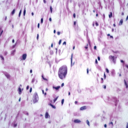

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  amebiasis


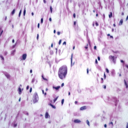

###################################################################
Question:  is amebiasis present?
Predicted Answer:  no
Actual Answer:  yes


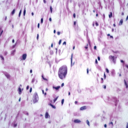

###################################################################
Question:  is lymphangiomatosis present?
Predicted Answer:  no
Actual Answer:  no


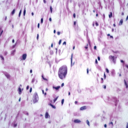

###################################################################
Question:  where is this from?
Predicted Answer:  no
Actual Answer:  gastrointestinal system


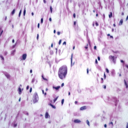

###################################################################
Question:  what shows bundles of normal - looking smooth muscle cells?
Predicted Answer:  no
Actual Answer:  microscopic appearance of leiomyoma


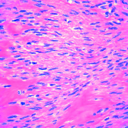

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


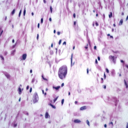

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  colon


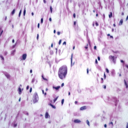

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  amebiasis


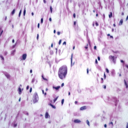

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  inclusion bodies


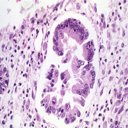

###################################################################
Question:  does this image show inclusion bodies?
Predicted Answer:  no
Actual Answer:  yes


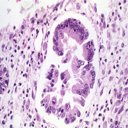

###################################################################
Question:  does atrophy show inclusion bodies?
Predicted Answer:  no
Actual Answer:  no


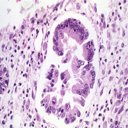

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


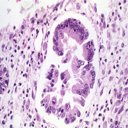

###################################################################
Question:  is gastrointestinal present?
Predicted Answer:  no
Actual Answer:  yes


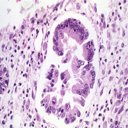

###################################################################
Question:  is antitrypsin present?
Predicted Answer:  no
Actual Answer:  no


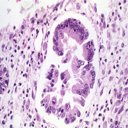

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  stomach


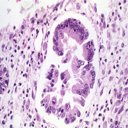

###################################################################
Question:  what does the microscopic appearance of leiomyoma show?
Predicted Answer:  no
Actual Answer:  bundles of normal - looking smooth muscle cells


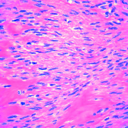

###################################################################
Question:  is stomach present?
Predicted Answer:  no
Actual Answer:  yes


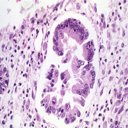

###################################################################
Question:  is cranial artery present?
Predicted Answer:  no
Actual Answer:  no


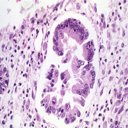

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  cytomegalovirus


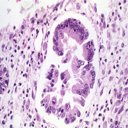

###################################################################
Question:  is cytomegalovirus present?
Predicted Answer:  no
Actual Answer:  yes


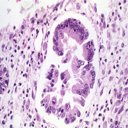

###################################################################
Question:  is acute lymphocytic leukemia present?
Predicted Answer:  no
Actual Answer:  no


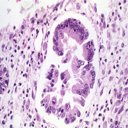

###################################################################
Question:  where is this from?
Predicted Answer:  no
Actual Answer:  gastrointestinal system


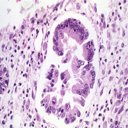

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  gastrointestinal


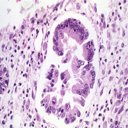

###################################################################


In [22]:
# add batch dimension + move to GPU|
for x in range(100):
    sample = val_vqa_dataset[x]
    print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
    sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

    # forward pass
    outputs = model.generate(pixel_values=sample['pixel_values'],
                            input_ids=sample['input_ids'])
    print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
    print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
    #########################################################################
    unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
    unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
    unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
    display(Image.fromarray(unnormalized_image))
    #########################################################################
    print("###################################################################")

Question:  is cytomegalovirus present?
Predicted Answer:  no
Actual Answer:  no


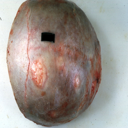

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  metastatic pancreas carcinoma


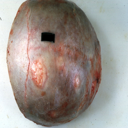

###################################################################
Question:  is metastatic pancreas carcinoma present?
Predicted Answer:  no
Actual Answer:  yes


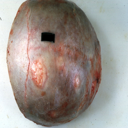

###################################################################
Question:  do the principal cellular alterations that characterize reversible cell injury and necrosis include flat epithelial atypia, adh, and dc
Predicted Answer:  no
Actual Answer:  no


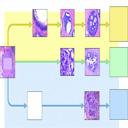

###################################################################
Question:  is eye present?
Predicted Answer:  no
Actual Answer:  no


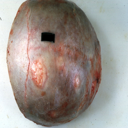

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone, calvarium


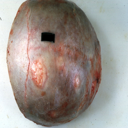

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  metastatic pancreas carcinoma


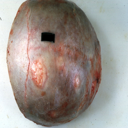

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  several rather large lesions


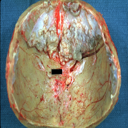

###################################################################
Question:  does this image show several rather large lesions?
Predicted Answer:  no
Actual Answer:  yes


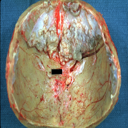

###################################################################
Question:  does opened base of skull with brain show several rather large lesions?
Predicted Answer:  no
Actual Answer:  no


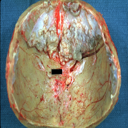

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone


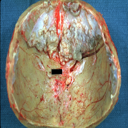

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


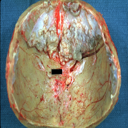

###################################################################
Question:  is medial aspect present?
Predicted Answer:  no
Actual Answer:  no


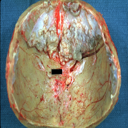

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  exostosis


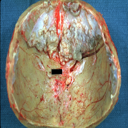

###################################################################
Question:  what are classified as luminal by gene expression profiling?
Predicted Answer:  no
Actual Answer:  er - positive carcinomas


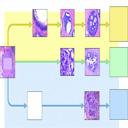

###################################################################
Question:  is exostosis present?
Predicted Answer:  no
Actual Answer:  yes


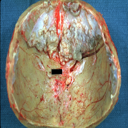

###################################################################
Question:  is umbilical cord present?
Predicted Answer:  no
Actual Answer:  no


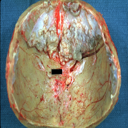

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone, calvarium


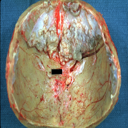

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  exostosis


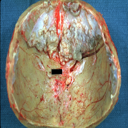

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  close - up view of base of skull with several well shown fractures


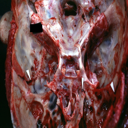

###################################################################
Question:  how does this image show close - up view of base of skull?
Predicted Answer:  no
Actual Answer:  with several well shown fractures


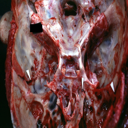

###################################################################
Question:  does this image show close - up view of base of skull with several well shown fractures?
Predicted Answer:  no
Actual Answer:  yes


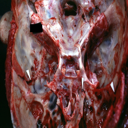

###################################################################
Question:  does amyloid angiopathy r. endocrine show close - up view of base of skull with several well shown fractures?
Predicted Answer:  no
Actual Answer:  no


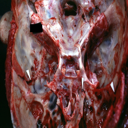

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone


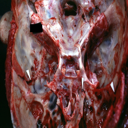

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


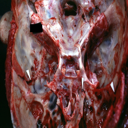

###################################################################
Question:  are these cancers classified as luminal by gene expression profiling?
Predicted Answer:  no
Actual Answer:  yes


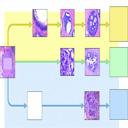

###################################################################
Question:  is myoma lesion present?
Predicted Answer:  no
Actual Answer:  no


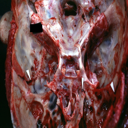

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  basilar skull fracture


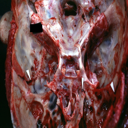

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


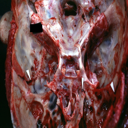

###################################################################
Question:  is hemorrhagic corpus luteum present?
Predicted Answer:  no
Actual Answer:  no


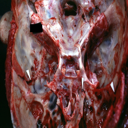

###################################################################
Question:  what well shown fractures?
Predicted Answer:  no
Actual Answer:  close - up view of base of skull with several


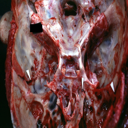

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone, calvarium


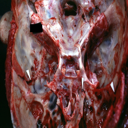

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  basilar skull fracture


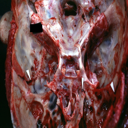

###################################################################
Question:  how is close - up view of base of skull with shown shown fractures?
Predicted Answer:  no
Actual Answer:  several


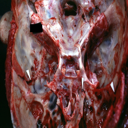

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  close - up view of lesions slide which is brain from case


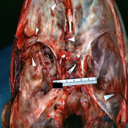

###################################################################
Question:  does this image show close - up view of lesions slide which is brain from this case?
Predicted Answer:  no
Actual Answer:  yes


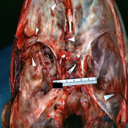

###################################################################
Question:  are skin stem cells classified as luminal by gene expression profiling?
Predicted Answer:  no
Actual Answer:  no


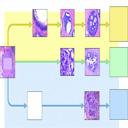

###################################################################
Question:  does inflamed exocervix show close - up view of lesions slide which is brain from this case?
Predicted Answer:  no
Actual Answer:  no


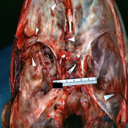

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone


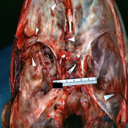

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


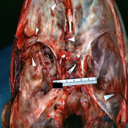

###################################################################
Question:  is focal hemorrhagic infarction well shown present?
Predicted Answer:  no
Actual Answer:  no


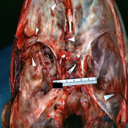

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  basilar skull fracture


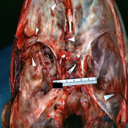

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


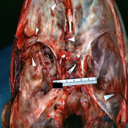

###################################################################
Question:  is alpha smooth muscle actin immunohistochemical present?
Predicted Answer:  no
Actual Answer:  no


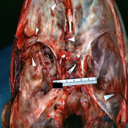

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone, calvarium


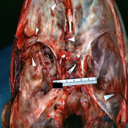

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  basilar skull fracture


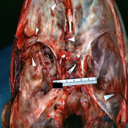

###################################################################
Question:  what is slide?
Predicted Answer:  no
Actual Answer:  fractures brain which and close - up view of these fractures


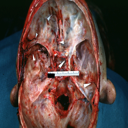

###################################################################
Question:  what is the type of cancer that arises most commonly in individuals with germline brca2 mutations?
Predicted Answer:  no
Actual Answer:  luminal


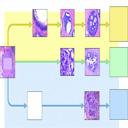

###################################################################
Question:  what is fractures brain which is slide and close - up view of these fractures?
Predicted Answer:  no
Actual Answer:  fractures


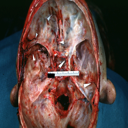

###################################################################
Question:  is fractures brain which is slide and close - up view of these fractures slide?
Predicted Answer:  no
Actual Answer:  yes


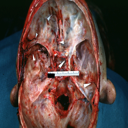

###################################################################
Question:  is lateral view of head with ear lobe crease and web neck other photos in file slide?
Predicted Answer:  no
Actual Answer:  no


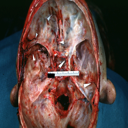

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  fractures brain which is slide and close - up view of these fractures is slide


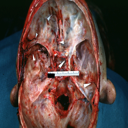

###################################################################
Question:  does this image show fractures brain which is slide and close - up view of these fractures is slide?
Predicted Answer:  no
Actual Answer:  yes


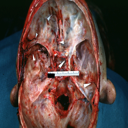

###################################################################
Question:  does nipple duplication show fractures brain which is slide and close - up view of these fractures is slide?
Predicted Answer:  no
Actual Answer:  no


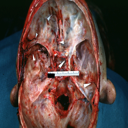

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone


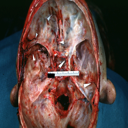

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


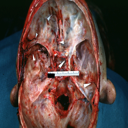

###################################################################
Question:  is intraductal papillomatosis with apocrine metaplasia present?
Predicted Answer:  no
Actual Answer:  no


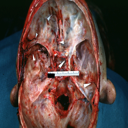

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  basilar skull fracture


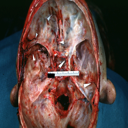

###################################################################
Question:  is the remote kidney infarct replaced by a large fibrotic scar?
Predicted Answer:  no
Actual Answer:  yes


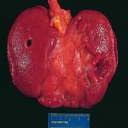

###################################################################
Question:  is this the type of cancer that arises most commonly in individuals with germline brca2 mutations?
Predicted Answer:  no
Actual Answer:  yes


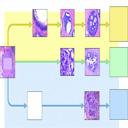

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


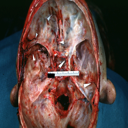

###################################################################
Question:  is acid present?
Predicted Answer:  no
Actual Answer:  no


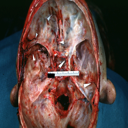

###################################################################
Question:  what is slide?
Predicted Answer:  no
Actual Answer:  fractures brain which and close - up view of these fractures


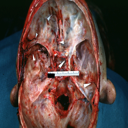

###################################################################
Question:  what is fractures brain which is slide and close - up view of these fractures?
Predicted Answer:  no
Actual Answer:  fractures


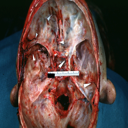

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone, calvarium


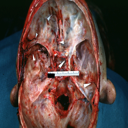

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  basilar skull fracture


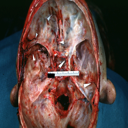

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  head tilted with mouth


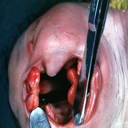

###################################################################
Question:  how does this image show head tilted?
Predicted Answer:  no
Actual Answer:  with mouth


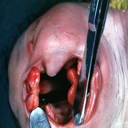

###################################################################
Question:  does this image show head tilted with mouth?
Predicted Answer:  no
Actual Answer:  yes


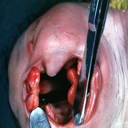

###################################################################
Question:  does anencephaly show head tilted with mouth?
Predicted Answer:  no
Actual Answer:  no


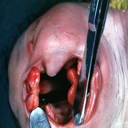

###################################################################
Question:  is show flow cytometry the type of cancer that arises most commonly in individuals with germline brca2 mutations?
Predicted Answer:  no
Actual Answer:  no


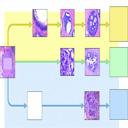

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  face


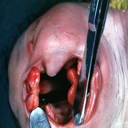

###################################################################
Question:  is face present?
Predicted Answer:  no
Actual Answer:  yes


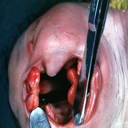

###################################################################
Question:  is opened uterus and cervix with large cervical myoma protruding into vagina slide present?
Predicted Answer:  no
Actual Answer:  no


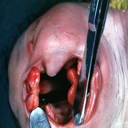

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bilateral cleft palate


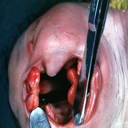

###################################################################
Question:  is bilateral cleft palate present?
Predicted Answer:  no
Actual Answer:  yes


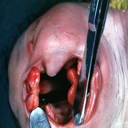

###################################################################
Question:  is newborn cord around neck present?
Predicted Answer:  no
Actual Answer:  no


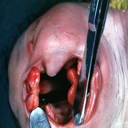

###################################################################
Question:  what opened to show large defect very good illustration of this lesion?
Predicted Answer:  no
Actual Answer:  head tilted with mouth


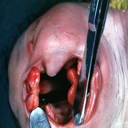

###################################################################
Question:  what is head tilted with mouth opened?
Predicted Answer:  no
Actual Answer:  to show large defect very good illustration of this lesion


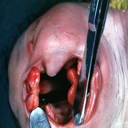

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  face


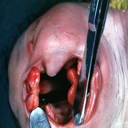

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bilateral cleft palate


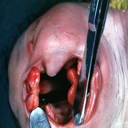

###################################################################
Question:  what is atypical apocrine adenosis, which shares features with apocrine dcis?
Predicted Answer:  no
Actual Answer:  a possible precursor lesion


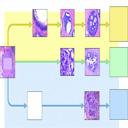

###################################################################
Question:  how is head tilted with mouth opened to show defect very good illustration of this lesion?
Predicted Answer:  no
Actual Answer:  large


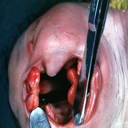

###################################################################
Question:  how is head tilted with mouth opened to show large defect very illustration of this lesion?
Predicted Answer:  no
Actual Answer:  good


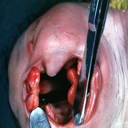

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone


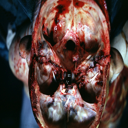

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


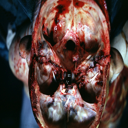

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  basilar skull fracture


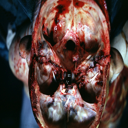

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


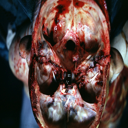

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone, calvarium


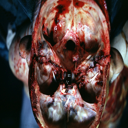

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  basilar skull fracture


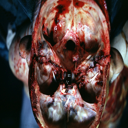

###################################################################
Question:  what does this image show?
Predicted Answer:  no
Actual Answer:  multiple fractures very well


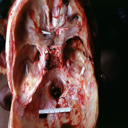

###################################################################
Question:  does this image show multiple fractures very well?
Predicted Answer:  no
Actual Answer:  yes


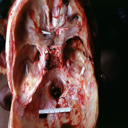

###################################################################
Question:  what is a possible precursor lesion, which shares features with apocrine dcis?
Predicted Answer:  no
Actual Answer:  atypical apocrine adenosis


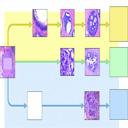

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone


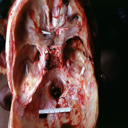

###################################################################
Question:  is bone, calvarium present?
Predicted Answer:  no
Actual Answer:  yes


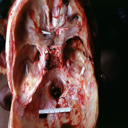

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  basilar skull fracture


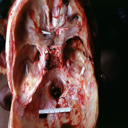

###################################################################
Question:  is basilar skull fracture present?
Predicted Answer:  no
Actual Answer:  yes


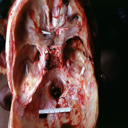

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  bone, calvarium


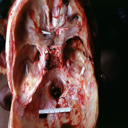

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  basilar skull fracture


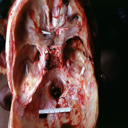

###################################################################
Question:  what is present?
Predicted Answer:  no
Actual Answer:  face


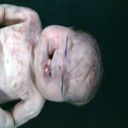

###################################################################


In [23]:
for x in range(500,600):
    sample = val_vqa_dataset[x]
    print("Question: ",text_processor.decode(sample['input_ids'], skip_special_tokens=True))
    sample = {k: v.unsqueeze(0).to(device) for k,v in sample.items()}

    # forward pass
    outputs = model.generate(pixel_values=sample['pixel_values'],
                            input_ids=sample['input_ids'])
    print("Predicted Answer: ",text_processor.decode(outputs[0],skip_special_tokens=True))
    print("Actual Answer: ",text_processor.decode(sample['labels'][0], skip_special_tokens=True))
    #########################################################################
    unnormalized_image = (sample["pixel_values"][0].cpu().numpy() * np.array(image_std)[:, None, None]) + np.array(image_mean)[:, None, None]
    unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
    unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
    display(Image.fromarray(unnormalized_image))
    #########################################################################
    print("###################################################################")